# Regression and Curve Fitting

In [1]:
%pylab inline
%config InlineBackend.figure_format = 'retina'

from astropy.table import Table
import daft
import exoplanet as xo
import numpy as np
import pandas as pd
import pymc3 as pm
import pymc3_ext as pmx
import seaborn as sns
import theano.tensor as T

sns.set_context('notebook')
sns.set_palette('colorblind')
sns.set_style('ticks')

Populating the interactive namespace from numpy and matplotlib


Regression is statistics-speak for analyzing a data set where one (or more) variables are measured perfectly or under the control of the experimenter (these are sometimes called "predictors," "covariates," "independent variables," ...), and one (or more) variables are measured (sometimes imperfectly) but not under the control of the experimenter.  Astronomers are often less precise, and sometimes use "regression" to refer to any time the dependence between two or more parameters is analyzed.  **Note: I am actually not totally sure what "regression" means---nor, I think, is anyone.  This is a pretty good definition.  You'll come to know it when you see it.**

## Linear Regression Example (Fake Data!)

Let's go thorugh a mock example first, a form of linear regression (later we will return to this example, which is analytically solvable, in fact!).  We will construct a linear relationship between $x$ and $y$:
$$
y = m x + b
$$

Text(0, 0.5, '$y$')

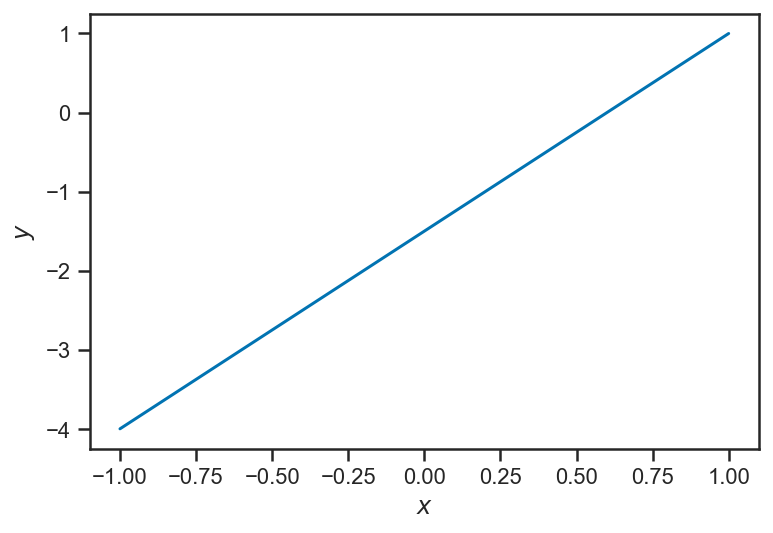

In [45]:
m_true = 2.5
b_true = -1.5

xs = linspace(-1, 1, 25)
ys_true = m_true*xs + b_true

plot(xs, ys_true)
xlabel(r'$x$')
ylabel(r'$y$')

Now we assume that we make imperfect observations of the "output" variables $y$.  For now, we set things up "homoskedastically" (whew! it means: with the same error or scatter in each observation):

Text(0, 0.5, '$y_\\mathrm{obs}$')

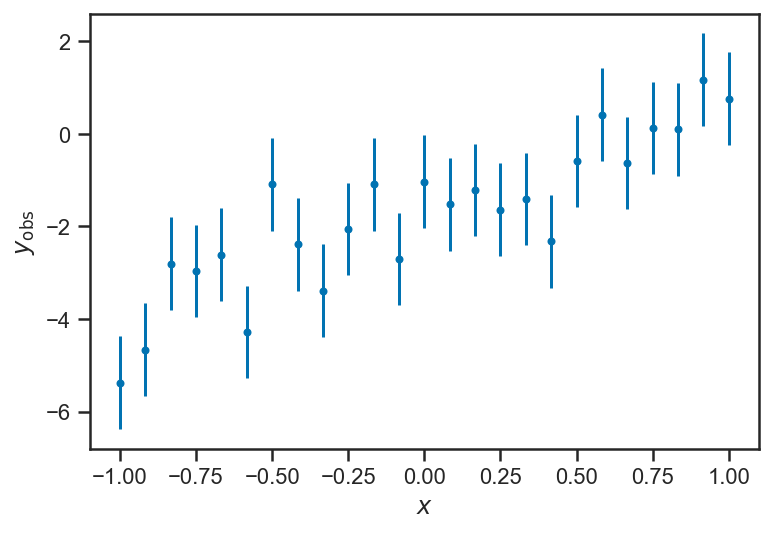

In [46]:
ys_obs = ys_true + randn(len(ys_true))
errorbar(xs, ys_obs, yerr=ones_like(ys_obs), fmt='.')
xlabel(r'$x$')
ylabel(r'$y_\mathrm{obs}$')

We can write a reasonable joint distribution for $m$, $b$, and the observed $y$ concisely in a `pymc3` model; it looks a lot like the `Turing` models we saw in previous chapters:

In [4]:
with pm.Model() as model:
    m = pm.Normal("m", 0, 4)
    b = pm.Normal("b", 0, 4)
    
    ys_true = pm.Deterministic("ys_true", m*xs + b)
    _ = pm.Normal("ys_obs", mu=ys_true, sigma=ones_like(ys_obs), observed=ys_obs)

Let's unpack this a bit.  First, we can draw our model graphically:

<Axes:>

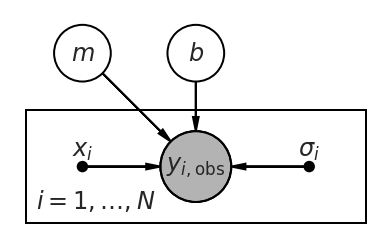

In [5]:
pgm = daft.PGM()

pgm.add_node('m', r'$m$', 0.5, 2)
pgm.add_node('b', r'$b$', 1.5, 2)

pgm.add_node('x', r'$x_i$', 0.5, 1, fixed=True)
pgm.add_node('y', r'$y_{i,\mathrm{obs}}$', 1.5, 1, observed=True, scale=1.25)

pgm.add_node('sigma', r'$\sigma_i$', 2.5, 1, fixed=True)

pgm.add_plate([0.0, 0.5, 3, 1.0], label=r'$i = 1, \ldots, N$')

pgm.add_edge('m', 'y')
pgm.add_edge('b', 'y')
pgm.add_edge('x', 'y')
pgm.add_edge('sigma', 'y')

pgm.render()

Our model here says that we are making repeated observations of $y_i$, $i = 1, \ldots, N$.  For each observation, we are also given the value(s) of $x_i$ and $\sigma_i$.  The observed value $y_i$ depends on these inputs, as well as the parameters $m$ and $b$.  The *form* of this dependence is specified in the model above: 
$$
y_i \sim N\left( m x_i + b, \sigma_i \right).
$$

In words: we assume that there is a "true" value of $y_i = m x_i + b$ that is linearly related to $x_i$.  Then we make a (noisy) observation of $y_i$, $y_{i,\mathrm{obs}} = y_i + \epsilon_i$ where $\epsilon_i \sim N\left( 0, \sigma_i \right)$ is the random "noise" contaminating our measurement.

Fitting the model to our data is straightforward:

In [6]:
with model:
    trace_linear = pm.sample()

/var/folders/35/vcq24mtj2_g5wk96mbck0cw400018s/T/ipykernel_83870/1043220295.py:2: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  trace_linear = pm.sample()
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [b, m]


Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 14 seconds.


Looking at the trace plots, we see that there is good "mixing" between the two independent chains, and within each chain as well:

/Users/wfarr/miniconda3/envs/Astrostatistics688/lib/python3.9/site-packages/arviz/data/io_pymc3.py:96: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  warnings.warn(


array([[<AxesSubplot:title={'center':'m'}>,
        <AxesSubplot:title={'center':'m'}>],
       [<AxesSubplot:title={'center':'b'}>,
        <AxesSubplot:title={'center':'b'}>],
       [<AxesSubplot:title={'center':'ys_true'}>,
        <AxesSubplot:title={'center':'ys_true'}>]], dtype=object)

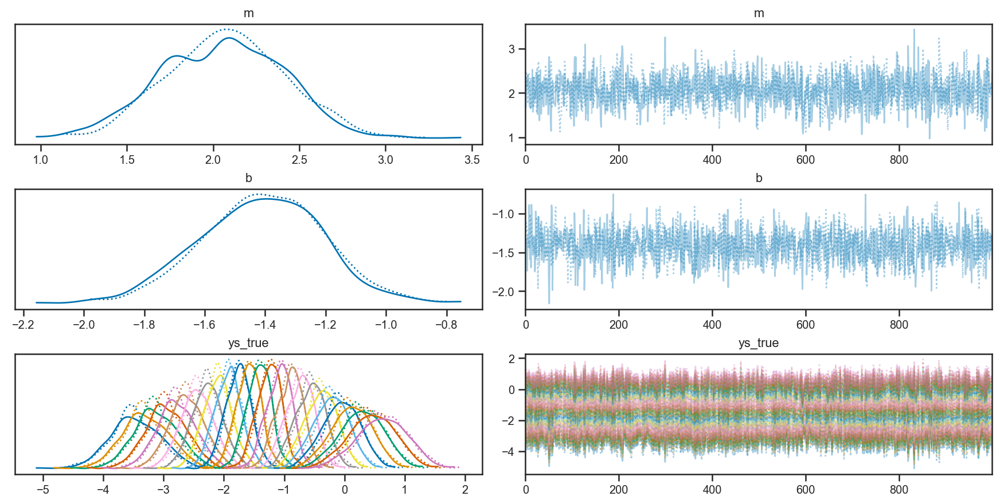

In [7]:
pm.plot_trace(trace_linear)

We asked our model to output its guess of $y_i$ at each iteration, via the line:
```python
    ys_true = pm.Deterministic("ys_true", m*xs + b)
```
Our model makes a *very strong* claim about $y_i$: it is *exactly* predicted by $m$, $b$, and the given $x_i$.  The only uncertainty we have about it is that we don't know $m$ and $b$!  But we have a large number of measurements, and so quite tightly constrain $m$ and $b$ with our data set; correspondingly, the plot below, which compares the uncertainty in the *observations* (is black) to the uncertainty in the *inferences* (in blue), the uncertainty about $y_i$ is substantially reduced by our model:

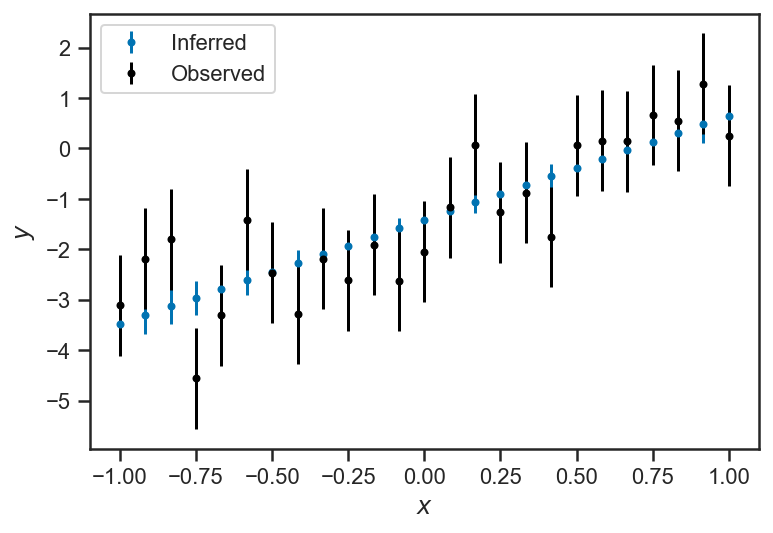

In [8]:
errorbar(xs, mean(trace_linear['ys_true'], axis=0), yerr=std(trace_linear['ys_true'], axis=0), fmt='.', label=r'Inferred')
errorbar(xs, ys_obs, yerr=ones_like(ys_obs), color='black', fmt='.', label=r'Observed')
xlabel(r'$x$')
ylabel(r'$y$')
legend(loc='best')

It is helpful to look at the uncertainty about the model's estimate of each $y$ alone:

Text(0, 0.5, '$y$')

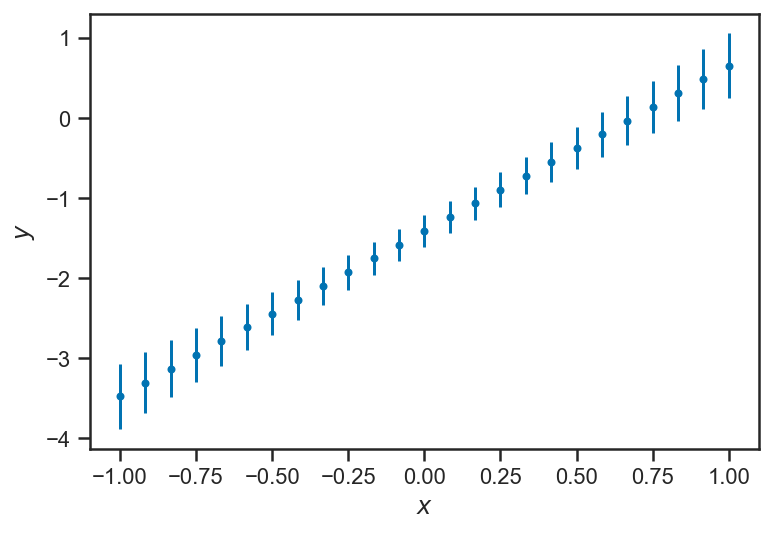

In [9]:
errorbar(xs, mean(trace_linear['ys_true'], axis=0), yerr=std(trace_linear['ys_true'], axis=0), fmt='.')
xlabel(r'$x$')
ylabel(r'$y$')

The inferences about $y$ become less and certain near the "edges" of the domain.  This is a general feature of regressions: because all the $y$ are "linked" through the regression formula, nearby (or even distant!) observations inform our estimate of any particular $y_i$.  But because of the interaction of uncertainties in our inferences about the slope $m$ and intercept $b$ the points in the "middle" are the most constrained, while the ones at the "edges" are less so.  This is particularly clear when we plot "traces" of the fitted lines: for each sample of $m$ and $b$, we draw the corresponding line: 

Text(0, 0.5, '$y$')

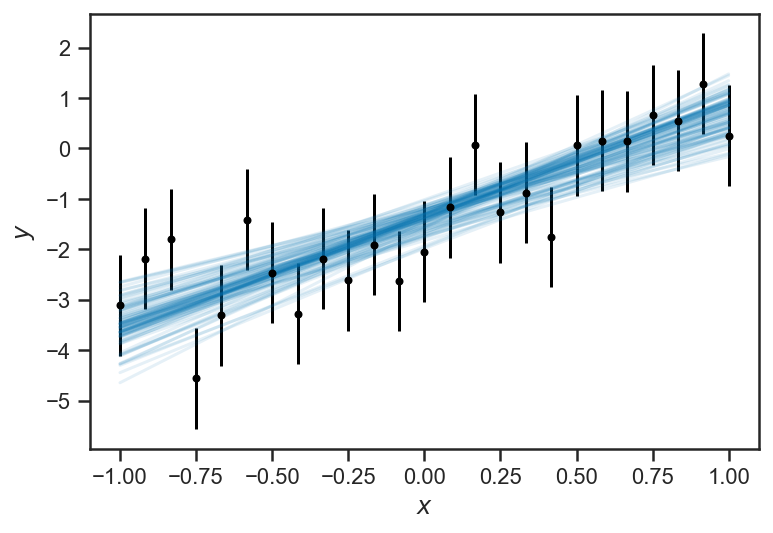

In [10]:
errorbar(xs, ys_obs, yerr=ones_like(ys_obs), color='black', fmt='.')
for _ in range(100):
    i = randint(trace_linear['ys_true'].shape[0])
    plot(xs, trace_linear['m'][i]*xs + trace_linear['b'][i], color=sns.color_palette()[0], alpha=0.1)
xlabel(r'$x$')
ylabel(r'$y$')

In class, we discussed how we could extend this model; here we added a quadratic term to the regression function, fitting 
$$
y = a x^2 + b x + c.
$$
In a real-life situation, whether this is a natural model extension depends on the physics of the situation; if we, for example, are dealing with a physical environment where a Taylor series is appropriate, then the quadratic function is the "next" natural extension beyond the linear.  In other cases, however, it may not be "natural."  

In [11]:
with pm.Model() as quadratic_model:
    c = pm.Normal("c", 0, 4)
    b = pm.Normal("b", 0, 4)
    a = pm.Normal("a", 0, 7)
    
    ys_true = pm.Deterministic("ys_true", c + xs*(b + a*xs))
    _ = pm.Normal("ys_obs", mu=ys_true, sigma=ones_like(ys_obs), observed=ys_obs)

In [12]:
with quadratic_model:
    quadratic_trace = pm.sample()

/var/folders/35/vcq24mtj2_g5wk96mbck0cw400018s/T/ipykernel_83870/2923709653.py:2: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  quadratic_trace = pm.sample()
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [a, b, c]


Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 14 seconds.


/Users/wfarr/miniconda3/envs/Astrostatistics688/lib/python3.9/site-packages/arviz/data/io_pymc3.py:96: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  warnings.warn(


array([[<AxesSubplot:title={'center':'c'}>,
        <AxesSubplot:title={'center':'c'}>],
       [<AxesSubplot:title={'center':'b'}>,
        <AxesSubplot:title={'center':'b'}>],
       [<AxesSubplot:title={'center':'a'}>,
        <AxesSubplot:title={'center':'a'}>],
       [<AxesSubplot:title={'center':'ys_true'}>,
        <AxesSubplot:title={'center':'ys_true'}>]], dtype=object)

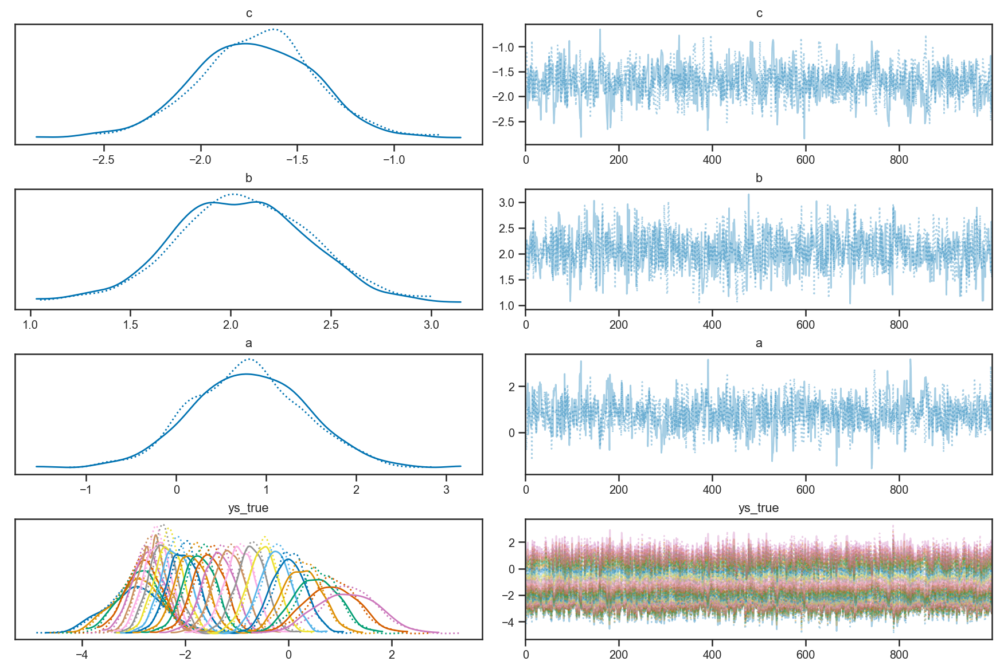

In [13]:
pm.plot_trace(quadratic_trace)

Here you can see a similar traceplot of the fitted functions; the "broadening" at the ends of the range is even more apparent.

Text(0, 0.5, '$y$')

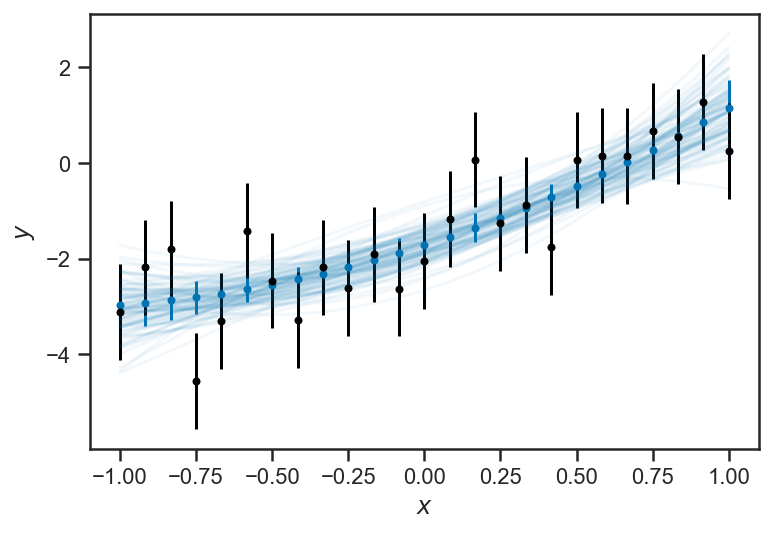

In [14]:
errorbar(xs, mean(quadratic_trace['ys_true'], axis=0), yerr=std(quadratic_trace['ys_true'], axis=0), fmt='.')
for i in range(100):
    plot(xs, quadratic_trace['ys_true'][randint(quadratic_trace['ys_true'].shape[0]), :], color=sns.color_palette()[0], alpha=0.05)
errorbar(xs, ys_obs, yerr=ones_like(ys_obs), color='black', fmt='.')
xlabel(r'$x$')
ylabel(r'$y$')

We find that the new "coefficient" is consistent with zero, but not terribly well constrained (the natural "scale" of the data is $\left| x \right| \simeq 1$, so $\left| a \right| \simeq 1$ induces a variation in $y$ that is also $\mathcal{O}(1)$ (as can be seen on the above plot).  We "know" that $a = 0$ because of the way we generated our data; at least the fit is consistent with that.

Text(0.5, 0, '$a$')

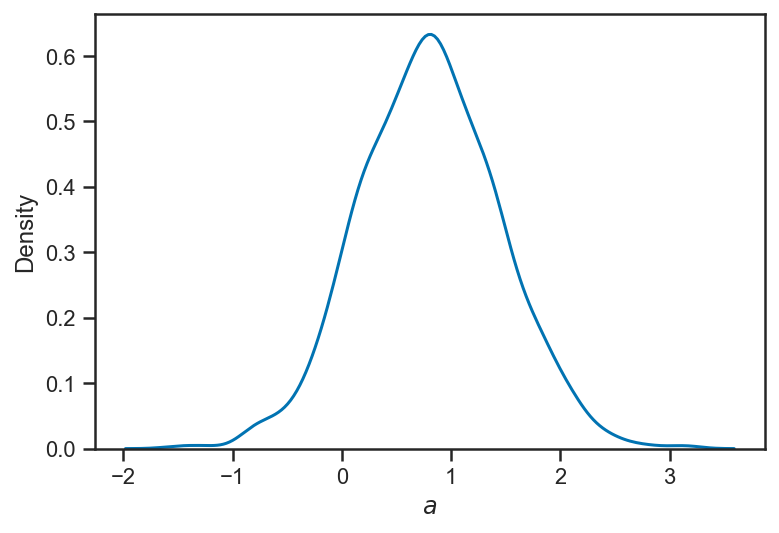

In [15]:
sns.kdeplot(quadratic_trace['a'])
xlabel(r'$a$')

Another possible model extension is to relax our assumption that the true value of $y$ is given exactly by the fitting formula ($y = m x + b$ or $y = a x^2 + b x + c$); instead, maybe we can assume that the fitting formula gives the *average* value of $y$, but the true value is a random variable distributed normally about the fitting formula.  For simplicity's sake, we will assume that the scatter around the fitting formula is the same at all values of $x$.  Our model is now 
$$
y_i \sim N\left( m x_i + b, \sigma \right)
$$
and then we have a noisy observation 
$$
y_{i,\mathrm{obs}} \sim N\left( y_i, \sigma_i \right).
$$

Graphically, this becomes:

<Axes:>

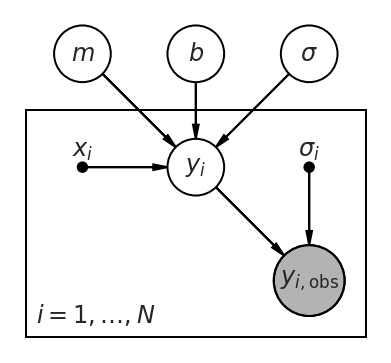

In [16]:
pgm = daft.PGM()

pgm.add_node('m', r'$m$', 0.5, 2)
pgm.add_node('b', r'$b$', 1.5, 2)
pgm.add_node('sigma', r'$\sigma$', 2.5, 2)

pgm.add_node('x', r'$x_i$', 0.5, 1, fixed=True)
pgm.add_node('y', r'$y_i$', 1.5, 1)

pgm.add_node('y_obs', r'$y_{i,\mathrm{obs}}$', 2.5, 0, observed=True, scale=1.25)
pgm.add_node('sigma_i', r'$\sigma_i$', 2.5, 1, fixed=True)

pgm.add_plate([0.0, -0.5, 3, 2.0], label=r'$i = 1, \ldots, N$')

pgm.add_edge('m', 'y')
pgm.add_edge('b', 'y')
pgm.add_edge('x', 'y')
pgm.add_edge('sigma', 'y')
pgm.add_edge('y', 'y_obs')
pgm.add_edge('sigma_i', 'y_obs')

pgm.render()

We can learn the "intrinsic scatter" about the fitting relation from this model; the $\sigma$ parameter represents any extra observed scatter beyond what is supported by the observational uncertainty.  In the limit that $\sigma \to 0$ we recover the original model above, where the true values of $y$ follow the fitting relation perfectly.

In many settings (econometrics, for example), there may not be *any* measurement error (i.e. our $\sigma_i = 0$), but nevertheless there can be effects in the system being modeled that are not captured by the fitting formula; to the extent that such effects are "random" in the $x_i$, a model such as this one, with intrinsic scatter, can be appropriate.  Even if the effects *are* dependent on $x_i$, including the extra flexibility to permit scatter off the relation can lead to more robust inferences than a model that forces $y_i = m x_i + b$.

The $\sigma \to 0$ limit is also tricky for the sampler; when $\sigma \to 0$ all the true $y$ values are constrained *exactly* to the fitting relation, while with $\sigma \gg 0$ they are free to scatter far from it.  This introduces a non-linear correlation between $\sigma$ and the true $y$ values that takes on a funnel shape; it is known as [Neal's funnel](https://mc-stan.org/docs/2_18/stan-users-guide/reparameterization-section.html) after {cite:p}`Neal2000`.  We can eliminate this correlation by sampling instead over a variable, $\delta \hat{y}_i$, which represents the deviation in each $y_i$ from the fitting relation in units of the scatter $\sigma$:
$$
y_i = m x_i + b + \sigma \delta \hat{y}_i.
$$
Appling a standard normal distribution to $\hat{y}_i$ induces a $N\left( m x_i + b, \sigma \right)$ distribution on $y_i$.  The re-parameterization replaces the commented-out line 
```python
    # ys_true = pm.Normal("ys_true", mu=m*xs+b, sigma=sigma)
```
with 
```python
    dy_unit = pm.Normal("dy_unit", mu=0, sigma=1, shape=ys_obs.shape)
    ys_true = pm.Deterministic("ys_true", m*xs+b+sigma*dy_unit)
```

In [17]:
with pm.Model() as intrinsic_error_model:
    m = pm.Normal("m", mu=0, sigma=4)
    b = pm.Normal("b", mu=0, sigma=4)
    
    sigma = pm.HalfNormal("sigma", sigma=1)
    
    # ys_true = pm.Normal("ys_true", mu=m*xs+b, sigma=sigma)    
    dy_unit = pm.Normal("dy_unit", mu=0, sigma=1, shape=ys_obs.shape)
    ys_true = pm.Deterministic("ys_true", m*xs+b+sigma*dy_unit)
    
    _ = pm.Normal("ys_obs", mu=ys_true, sigma=1, observed=ys_obs)

In [18]:
with intrinsic_error_model:
    trace_intrinsic = pm.sample()

/var/folders/35/vcq24mtj2_g5wk96mbck0cw400018s/T/ipykernel_83870/2730893626.py:2: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  trace_intrinsic = pm.sample()
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [dy_unit, sigma, b, m]


Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 12 seconds.
There was 1 divergence after tuning. Increase `target_accept` or reparameterize.
There were 3 divergences after tuning. Increase `target_accept` or reparameterize.


/Users/wfarr/miniconda3/envs/Astrostatistics688/lib/python3.9/site-packages/arviz/data/io_pymc3.py:96: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  warnings.warn(


array([[<AxesSubplot:title={'center':'m'}>,
        <AxesSubplot:title={'center':'m'}>],
       [<AxesSubplot:title={'center':'b'}>,
        <AxesSubplot:title={'center':'b'}>],
       [<AxesSubplot:title={'center':'dy_unit'}>,
        <AxesSubplot:title={'center':'dy_unit'}>],
       [<AxesSubplot:title={'center':'sigma'}>,
        <AxesSubplot:title={'center':'sigma'}>],
       [<AxesSubplot:title={'center':'ys_true'}>,
        <AxesSubplot:title={'center':'ys_true'}>]], dtype=object)

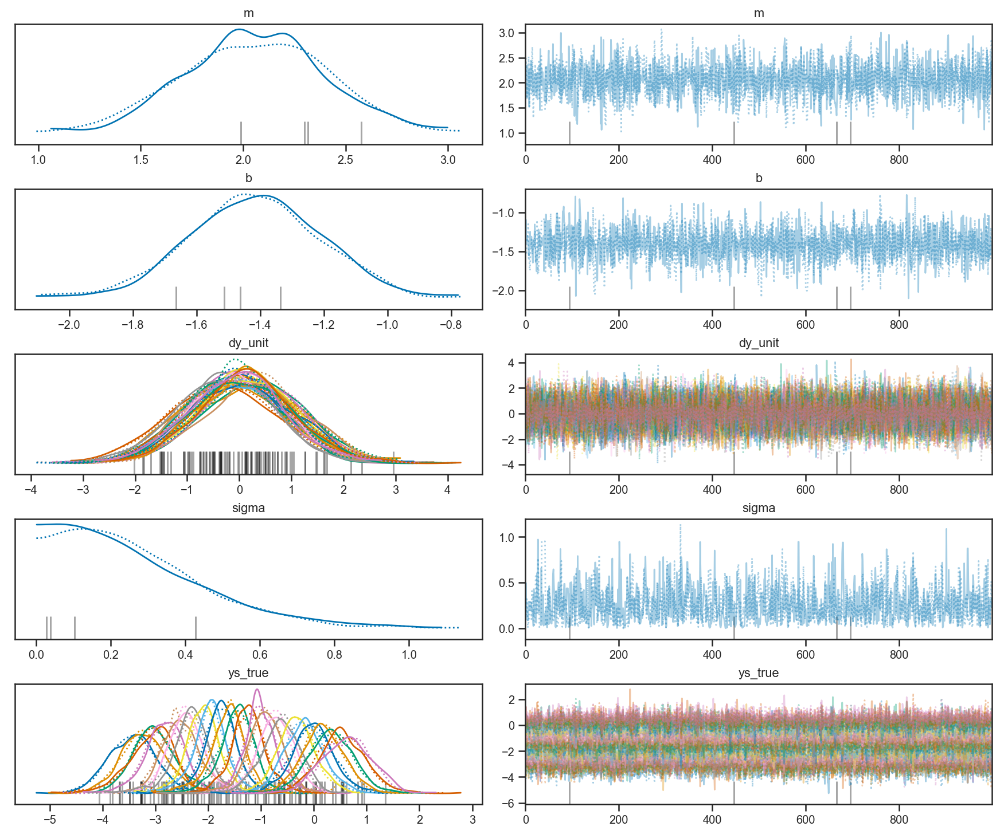

In [19]:
pm.plot_trace(trace_intrinsic)

Now we can look at the inferences about the true $y_i$ in this model.  We see that they follow, more or less, the linear relation, but there is "structure" from the random observational scatter imprinted in their inferences.  The "intrinsic scatter" model weighs the scatter inferred about the relation represented by $\sigma$ against the observational uncertainties $\sigma_i$ for each data point.  The true value is a compromise between the relation and the observation.

Text(0, 0.5, '$y$')

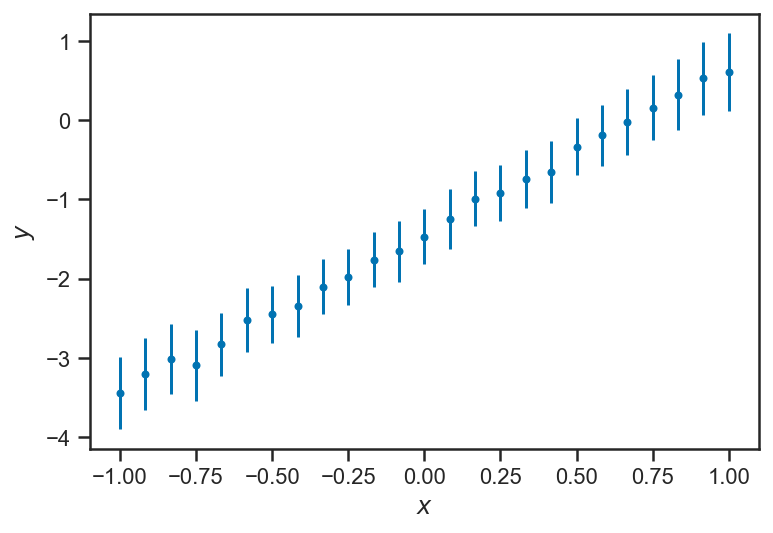

In [20]:
errorbar(xs, trace_intrinsic["ys_true"].mean(axis=0), yerr=trace_intrinsic["ys_true"].std(axis=0), fmt='.', label="Posterior")
xlabel(r'$x$')
ylabel(r'$y$')

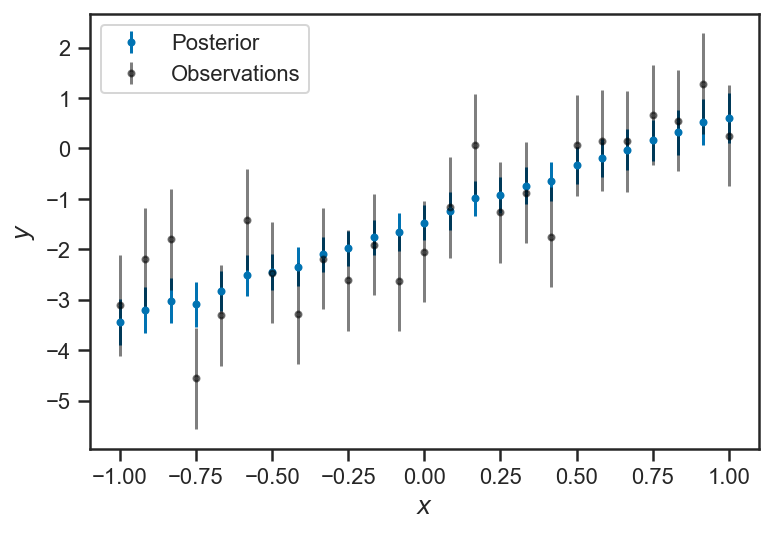

In [21]:
errorbar(xs, trace_intrinsic["ys_true"].mean(axis=0), yerr=trace_intrinsic["ys_true"].std(axis=0), fmt='.', label="Posterior")
errorbar(xs, ys_obs, yerr=ones_like(ys_obs), fmt='.', color="black", label="Observations", alpha=0.5)
xlabel(r'$x$')
ylabel(r'$y$')
legend(loc='best')

Our inference about $\sigma$ suggests that it is rather small (considerably smaller than the observational uncertainty).  In truth $\sigma = 0$ (our data were generated from a strictly-linear model); with enough observations we could eventually constrain $\sigma$ to be quite small.

Text(0, 0.5, '$p\\left( \\sigma \\right)$')

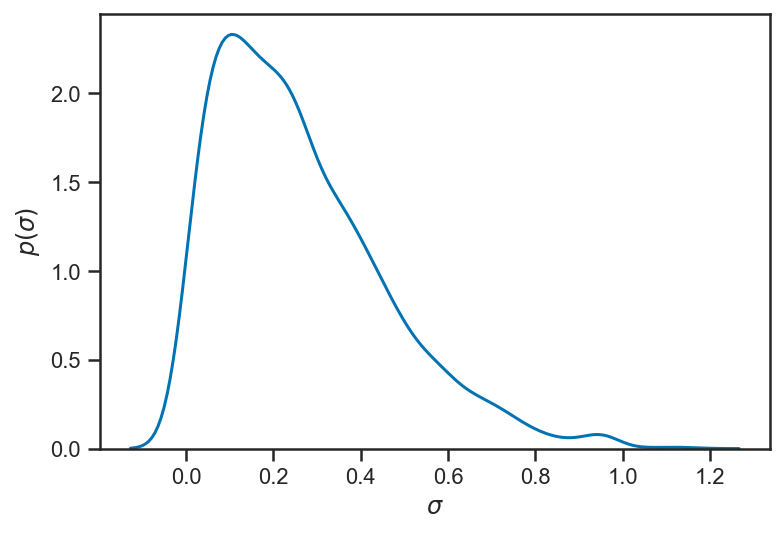

In [22]:
sns.kdeplot(trace_intrinsic['sigma'])
xlabel(r'$\sigma$')
ylabel(r'$p\left( \sigma \right)$')

### Uncertian About $x$?

Let's explore our linear regression example as if we were uncertain about $x$ as well.  We will generate some $x$ observations that reflect the uniformly-spaced $x$ values with some observational error (normally distributed):

Text(0, 0.5, '$y$')

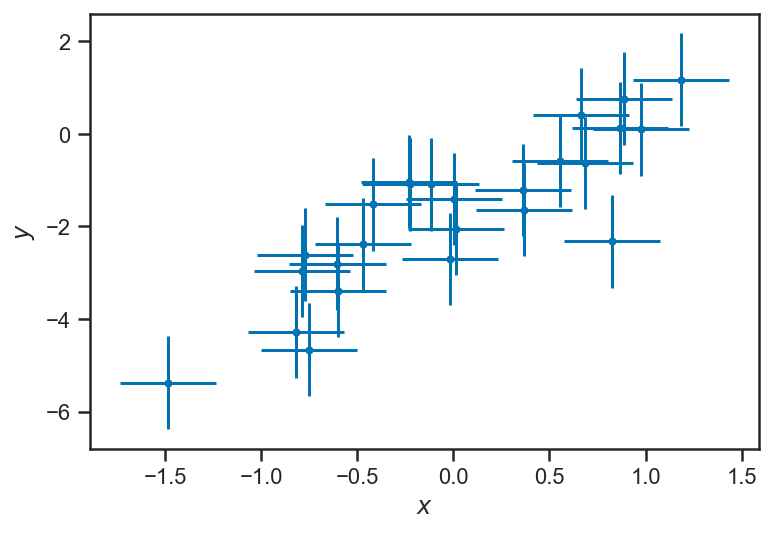

In [80]:
sigma_x = 0.25
xs_obs = xs + sigma_x * randn(len(xs))

errorbar(xs_obs, ys_obs, xerr=sigma_x, yerr=ones_like(ys_obs), fmt='.')
xlabel(r'$x$')
ylabel(r'$y$')

Now our graphical model must be extended to include the $x$ observations and (unknown) true values of $x$.  We need some parameters (here denoted $\theta$) that describe the way that the true $x_i$ are distributed.  (We need to assume *something* about how the $x$ values are distributed; even if we specify *no* "population" for the $x$, that, in itself, is assuming that they are uniformly distributed along the $x$--axis without any bounds.)

<Axes:>

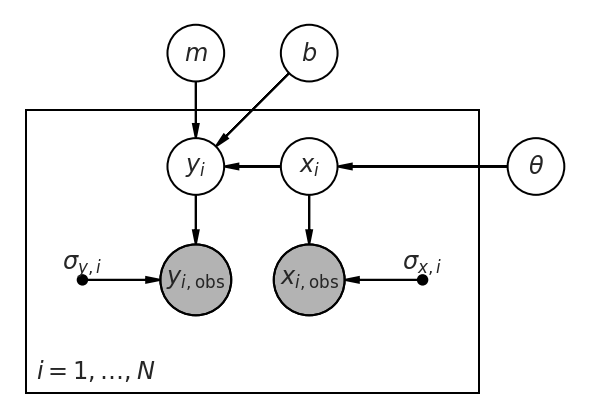

In [91]:
pgm = daft.PGM()

pgm.add_node("m", r'$m$', 0.5, 2)
pgm.add_node('b', r'$b$', 1.5, 2)

pgm.add_plate([-1, -1, 4, 2.5], r'$i = 1, \ldots, N$')

pgm.add_node('y', r'$y_i$', 0.5, 1)
pgm.add_node('x', r'$x_i$', 1.5, 1)

pgm.add_node('yobs', r'$y_{i,\mathrm{obs}}$', 0.5, 0, scale=1.25, observed=True)
pgm.add_node('xobs', r'$x_{i,\mathrm{obs}}$', 1.5, 0, scale=1.25, observed=True)

pgm.add_node('sigma_y', r'$\sigma_{y,i}$', -0.5, 0, fixed=True)
pgm.add_node('sigma_x', r'$\sigma_{x,i}$', 2.5, 0, fixed=True)

pgm.add_node('theta', r'$\theta$', 3.5, 1)

pgm.add_edge('m', 'y')
pgm.add_edge('b', 'y')
pgm.add_edge('x', 'y')

pgm.add_edge('theta', 'x')

pgm.add_edge('y', 'yobs')
pgm.add_edge('x', 'xobs')
pgm.add_edge('sigma_y', 'yobs')
pgm.add_edge('sigma_x', 'xobs')

pgm.render()

We can encode this model using `PyMC3` below; here we assume that $x \sim U(l, u)$ are uniformly distributed between unknown bounds, which is close to correct. (In fact, the true $x$ values were chosen *uniformly spaced* along the $x$ axis, which is not quite the same thing; but at least they have uniform density.) Other popular choices include using a Gaussian or mixture of Gaussians along the $x$ axis, as in {cite}`Kelly2007`.

In [58]:
with pm.Model() as x_uncert_model:
    l = pm.Normal("l", mu=-1, sigma=0.25)
    u = pm.Normal("u", mu=1, sigma=0.25)
    xs_model = pm.Uniform("xs", lower=l, upper=u, shape=len(xs_obs))
    
    m = pm.Normal("m", mu=0, sigma=4)
    b = pm.Normal("b", mu=0, sigma=4)
    
    ys_model = pm.Deterministic("ys", m*xs_model + b)
    
    _ = pm.Normal("ys_obs", mu=ys_model, sigma=ones_like(ys_obs), observed=ys_obs)
    _ = pm.Normal("xs_obs", mu=xs_model, sigma=sigma_x, observed=xs_obs)
    
    x_uncert_trace = pm.sample(draws=1000, tune=1000)

/var/folders/35/vcq24mtj2_g5wk96mbck0cw400018s/T/ipykernel_83870/1928717255.py:14: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  x_uncert_trace = pm.sample(draws=1000, tune=1000)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [b, m, xs, u, l]


Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 13 seconds.
The number of effective samples is smaller than 25% for some parameters.


We can see that our trace looks good (the mixing along the chain looks reasonable).  Note that our model has inferences about the true $x$ and true $y$, and that we do a reasonable job inferring that the bounds on $x$ are $-1 < x < 1$ from the observations.

/Users/wfarr/miniconda3/envs/Astrostatistics688/lib/python3.9/site-packages/arviz/data/io_pymc3.py:96: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  warnings.warn(


array([[<AxesSubplot:title={'center':'l'}>,
        <AxesSubplot:title={'center':'l'}>],
       [<AxesSubplot:title={'center':'u'}>,
        <AxesSubplot:title={'center':'u'}>],
       [<AxesSubplot:title={'center':'m'}>,
        <AxesSubplot:title={'center':'m'}>],
       [<AxesSubplot:title={'center':'b'}>,
        <AxesSubplot:title={'center':'b'}>],
       [<AxesSubplot:title={'center':'xs'}>,
        <AxesSubplot:title={'center':'xs'}>],
       [<AxesSubplot:title={'center':'ys'}>,
        <AxesSubplot:title={'center':'ys'}>]], dtype=object)

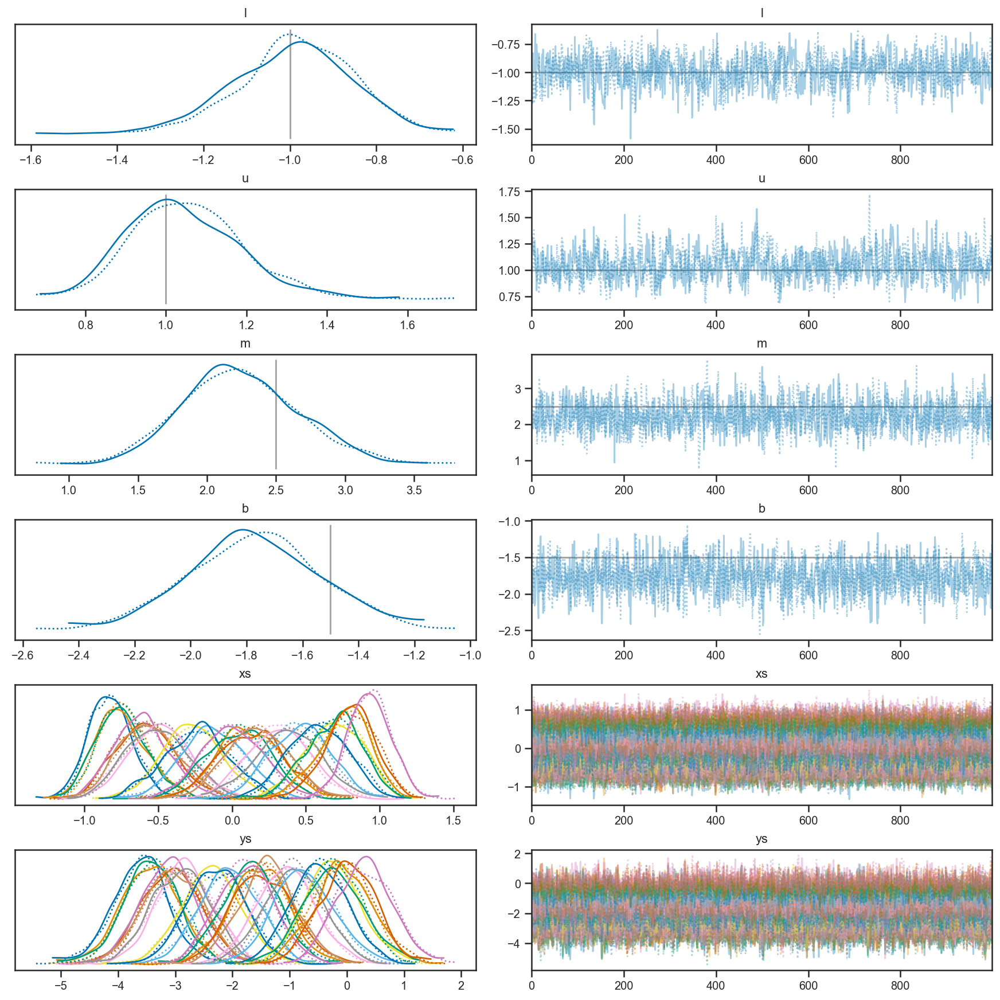

In [92]:
pm.plot_trace(x_uncert_trace, 
              lines=[('l', {}, -1),
                     ('u', {}, 1),
                     ("m", {}, m_true),
                     ("b", {}, b_true)])

We can plot the mean and standard deviation of the inferred $x$ and $y$ values against the observations, as well as the inferred linear relationship between $y$ and $x$:

Text(0, 0.5, '$y$')

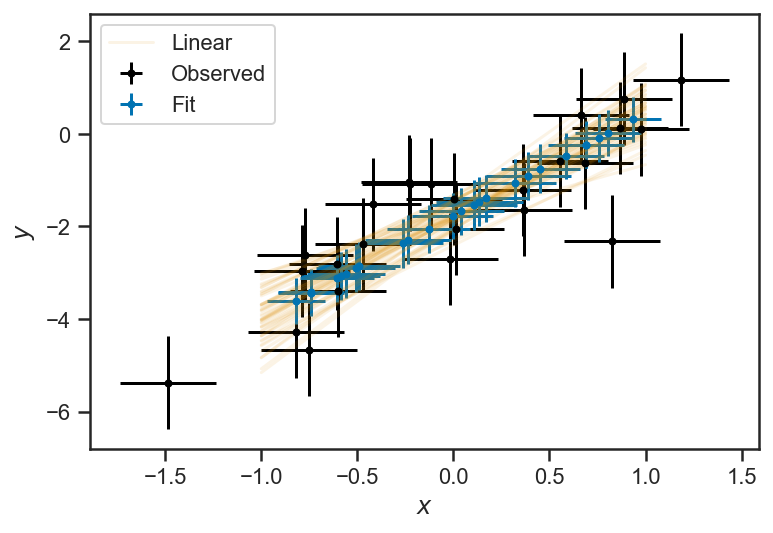

In [95]:
errorbar(xs_obs, ys_obs, xerr=sigma_x, yerr=ones_like(ys_obs), fmt='.', color='k', label="Observed")
errorbar(mean(x_uncert_trace['xs'], axis=0), mean(x_uncert_trace['ys'], axis=0), xerr=std(x_uncert_trace['xs'], axis=0), yerr=std(x_uncert_trace['ys'], axis=0), fmt='.', label="Fit")
for j in range(50):
    i = randint(x_uncert_trace['m'].shape[0])
    if j == 0:
        lab = 'Linear'
    else: 
        lab = None
    plot(xs, x_uncert_trace['m'][i]*xs + x_uncert_trace['b'][i], color=sns.color_palette()[1], alpha=0.1, label=lab)

legend(loc='best')
xlabel(r'$x$')
ylabel(r'$y$')

## Radial Velocity Curves and Exoplanet Orbital Parameters

51 Peg RV data, from [IPAC Exoplanet Archive](https://exoplanetarchive.ipac.caltech.edu/overview/51%20Peg%20b#overview).  These data are reported in {cite:t}`Butler2006`.

In [2]:
fopeg_data = Table.read('data/ButlerEtAl200651PegUID_0113357_RVC_001.tbl.txt', format='ascii')
fopeg_data

JD,Radial_Velocity,Radial_Velocity_Uncertainty
days,m / s,m / s
float64,float64,float64
2450002.665695,-52.9,4.1
2450002.68434,-45.8,4.8
2450002.80022,-60.8,4.6
2450002.815961,-53.3,5.0
2450002.954711,-60.9,5.5
2450002.968287,-57.3,7.0
...,...,...
2452173.74912,-52.7,5.8


This is the period reported by {cite:t}`Butler2006`:

In [3]:
P_fop = 4.230785 # (36) uncertainty in the last two digits!
sigma_P_fop = 0.000036

tmid = median(fopeg_data['JD'])

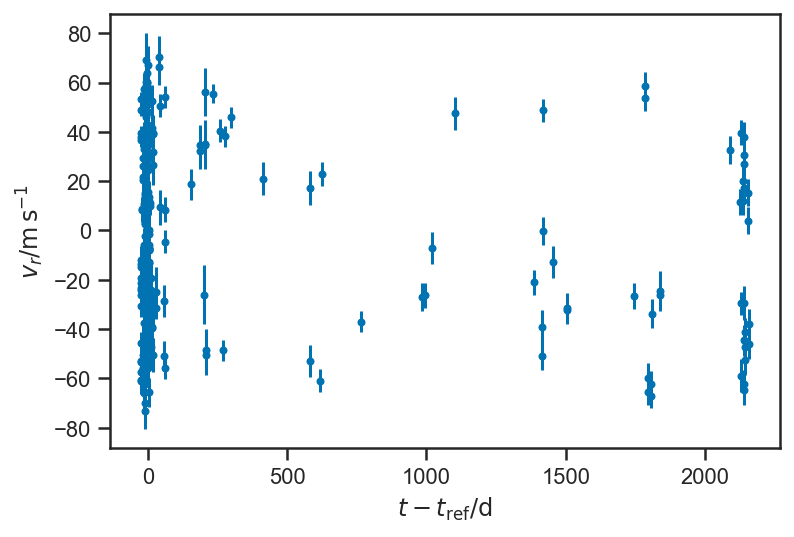

In [4]:
def plot_data(P=None, **kwargs):
    """Plot the 51 Peg data with errorbars.  If given, `P` is the period on which the plot should be folded.
    """
    if P is None:
        ts = fopeg_data['JD'] - tmid
        xlabel(r'$t - t_\mathrm{ref} / \mathrm{d}$')
    else:
        ts = (fopeg_data['JD'] - tmid) % P
        xlabel(r'$ \left( t - t_\mathrm{ref} \right) \, \mathrm{mod} \, P / \mathrm{d}$')
        
    errorbar(ts, fopeg_data['Radial_Velocity'], yerr=fopeg_data['Radial_Velocity_Uncertainty'], fmt='.', **kwargs)
    ylabel(r'$v_r / \mathrm{m} \, \mathrm{s}^{-1}$')
    
plot_data()

Doesn't look like much, but if we fold on the orbital period:

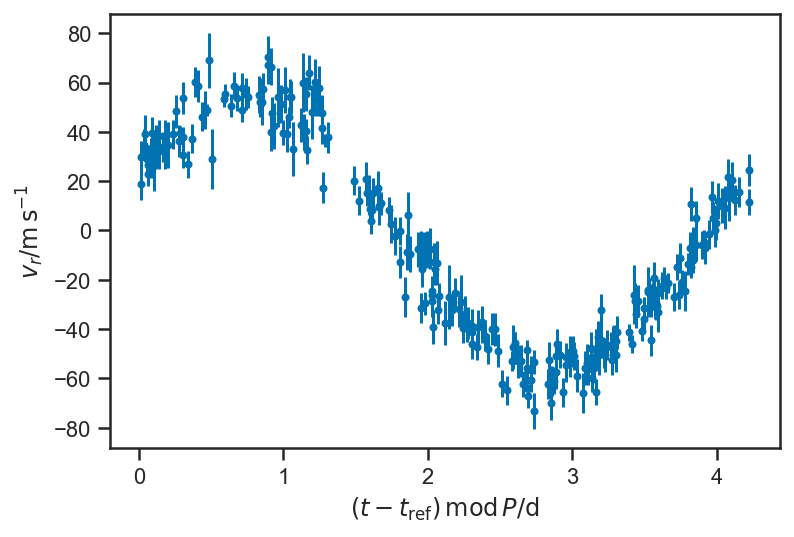

In [5]:
plot_data(P = P_fop)

Note Kepler's equations (e.g. {cite:t}`Fulton2018`):
$$
\frac{2 \pi \left( t - t_0 \right)}{P} = M = E - e \sin E
$$
with
$$
\nu = 2 \tan^{-1} \left( \sqrt{\frac{1+e}{1-e}} \tan \frac{E}{2} \right)
$$
and
$$
\dot{z} = v_r = K \left( \cos \left( \nu + \omega \right) + e \cos \omega \right),
$$
where 
* $t_0$ is the time of pericentre passage of the system.
* $P$ is the period.
* $e$ is the eccentricity.
* $E$ is the "eccentric anomaly".
* $\nu$ is the "true anomaly".
* $\omega$ is the argument of pericentre (of the star).
* $K$ is the semi-amplitude of the radial velocity (related to the planet and star masses and the inclination).

This formula relates something we measure "perfectly"---$t$, the time we measure the velocity---to something we measure with uncertainty, the radial velocity.  This is regression.

Below we implement a model that regresses the orbital parameters on the RV observations versus time.

**TODO: explain the rationale behind the unusual parameter choices below.**

In [6]:
with pm.Model() as basic_rv:
    K = pm.Lognormal("K", mu=log(55.0), sigma=0.1)
    
    dP = pm.Normal("dP", mu=0, sigma=10)
    P = pm.Deterministic("P", P_fop + sigma_P_fop*dP)
    
    # Eccentricity vector:
    A = pmx.UnitDisk("A", testval=[0.01, 0.01])
    e = pm.Deterministic("e", T.sqrt(A[0]*A[0] + A[1]*A[1]))
    omega = pm.Deterministic("omega", T.arctan2(A[1], A[0]))
    
    t0_frac = pm.Uniform("t0_frac", 0, 1, testval=0.5)
    t0 = pm.Deterministic("t0", tmid + P*t0_frac)
    
    orbit = xo.orbits.KeplerianOrbit(period=P, t0=t0, ecc=e, omega=omega)
    
    rv = pm.Deterministic("v_r", orbit.get_radial_velocity(fopeg_data['JD'], K=K))
    
    _ = pm.Normal("v_r_obs", mu=rv, sigma=fopeg_data['Radial_Velocity_Uncertainty'], observed=fopeg_data['Radial_Velocity'])

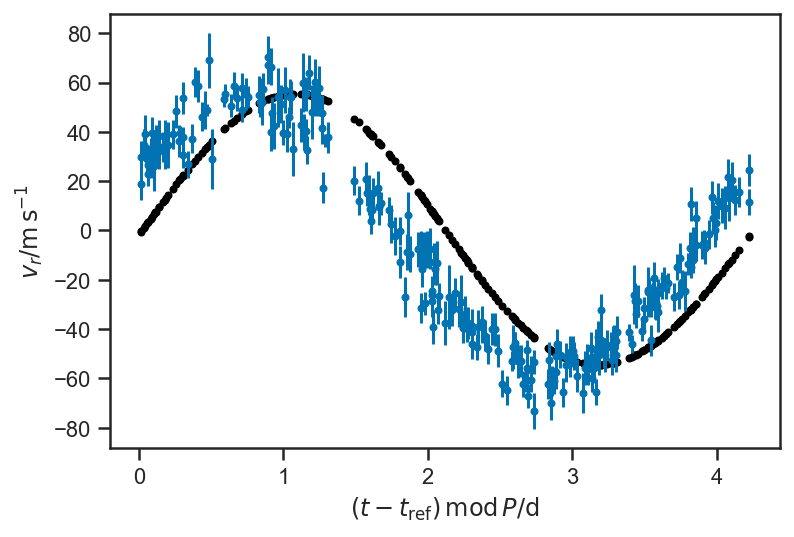

In [7]:
def plot_rv_curve(rvs, P=None, **kwargs):
    if P is None:
        ts = fopeg_data['JD'] - tmid
        xlabel(r'$t - t_\mathrm{ref} / \mathrm{d}$')
    else:
        ts = (fopeg_data['JD'] - tmid) % P
        xlabel(r'$ \left( t - t_\mathrm{ref} \right) \, \mathrm{mod} \, P / \mathrm{d}$')

    marker = kwargs.pop('marker', '.')
    scatter(ts, rvs, marker=marker, **kwargs)
plot_data(P=P_fop)
plot_rv_curve(pmx.eval_in_model(rv, basic_rv.test_point, model=basic_rv), P=P_fop, color='black')

The above plot shows a "guess" at the RV curve with some reasonable, but hardly "optimal" parameters.  We will improve it by optimizing the posterior density (obtaining the (M)aximum (AP)osteriori parameter values) in stages---first we optimize with respect to the phase of pericentre alone, then take that solution and optimize with respect to the phase of pericentre and period, and then finally take that solution and optimize with respect to all variables.  Such "staged" optimization can help avoid falling into a "local maximum" in complicated problems.

In [8]:
with basic_rv:
    map_soln = pmx.optimize(start=basic_rv.test_point, vars=[t0_frac])
    map_soln = pmx.optimize(start=map_soln, vars=[t0_frac, dP])
    map_soln = pmx.optimize(start=map_soln, vars=[t0_frac, dP, K, A])

optimizing logp for variables: [t0_frac]


message: Optimization terminated successfully.
logp: -2244.1075127125005 -> -895.194386147021
optimizing logp for variables: [dP, t0_frac]


message: Desired error not necessarily achieved due to precision loss.
logp: -895.194386147021 -> -892.0967029641428
optimizing logp for variables: [A, K, dP, t0_frac]


message: Optimization terminated successfully.
logp: -892.0967029641428 -> -889.7860524910117


The solution sure looks pretty optimal.

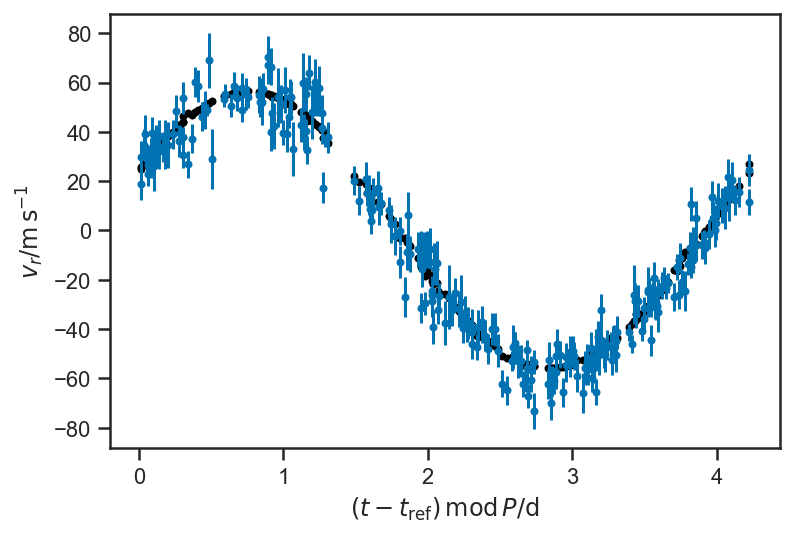

In [9]:
plot_data(P=P_fop)
plot_rv_curve(pmx.eval_in_model(rv, map_soln, model=basic_rv), P=P_fop, color='black')

Now we sample from the posterior over planet parameters.

In [12]:
with basic_rv:
    basic_rv_trace = pm.sample(tune=1000, draws=1000)

/var/folders/35/vcq24mtj2_g5wk96mbck0cw400018s/T/ipykernel_40610/3110477701.py:2: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  basic_rv_trace = pm.sample(tune=1000, draws=1000)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [t0_frac, A, dP, K]


Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 30 seconds.


In [11]:
pm.summary(basic_rv_trace)

/Users/wfarr/miniconda3/envs/Astrostatistics688/lib/python3.9/site-packages/arviz/data/io_pymc3.py:96: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  warnings.warn(


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
dP,-2.494,0.952,-4.308,-0.796,0.021,0.015,2145.0,1346.0,1.0
K,56.065,0.500,55.194,57.071,0.010,0.007,2298.0,1412.0,1.0
P,4.231,0.000,4.231,4.231,0.000,0.000,2145.0,1346.0,1.0
A[0],0.006,0.010,-0.013,0.024,0.000,0.000,1152.0,1308.0,1.0
A[1],0.010,0.009,-0.008,0.026,0.000,0.000,2099.0,1485.0,1.0
...,...,...,...,...,...,...,...,...,...
v_r[251],-41.531,0.989,-43.424,-39.763,0.020,0.014,2366.0,1529.0,1.0
v_r[252],15.099,1.401,12.631,17.772,0.029,0.020,2329.0,1591.0,1.0
v_r[253],12.608,1.408,10.103,15.262,0.029,0.021,2326.0,1564.0,1.0
v_r[254],-39.599,1.097,-41.616,-37.520,0.024,0.017,2158.0,1319.0,1.0


/Users/wfarr/miniconda3/envs/Astrostatistics688/lib/python3.9/site-packages/arviz/data/io_pymc3.py:96: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  warnings.warn(


array([[<AxesSubplot:title={'center':'dP'}>,
        <AxesSubplot:title={'center':'dP'}>],
       [<AxesSubplot:title={'center':'K'}>,
        <AxesSubplot:title={'center':'K'}>],
       [<AxesSubplot:title={'center':'P'}>,
        <AxesSubplot:title={'center':'P'}>],
       [<AxesSubplot:title={'center':'A'}>,
        <AxesSubplot:title={'center':'A'}>],
       [<AxesSubplot:title={'center':'e'}>,
        <AxesSubplot:title={'center':'e'}>],
       [<AxesSubplot:title={'center':'omega'}>,
        <AxesSubplot:title={'center':'omega'}>],
       [<AxesSubplot:title={'center':'t0_frac'}>,
        <AxesSubplot:title={'center':'t0_frac'}>],
       [<AxesSubplot:title={'center':'t0'}>,
        <AxesSubplot:title={'center':'t0'}>],
       [<AxesSubplot:title={'center':'v_r'}>,
        <AxesSubplot:title={'center':'v_r'}>]], dtype=object)

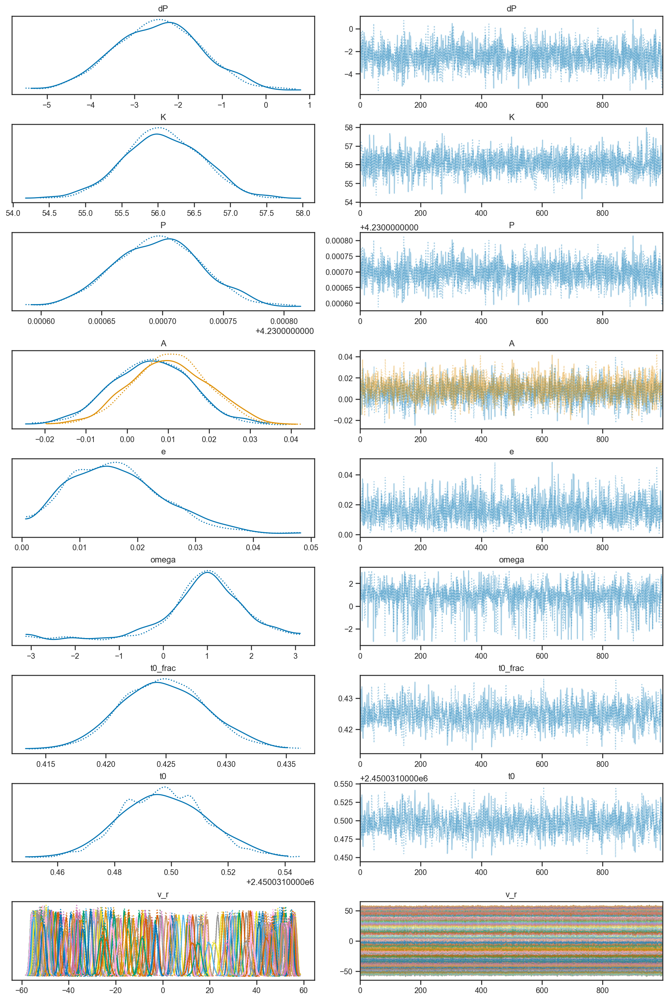

In [33]:
pm.plot_trace(basic_rv_trace)

/Users/wfarr/miniconda3/envs/Astrostatistics688/lib/python3.9/site-packages/arviz/data/io_pymc3.py:96: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  warnings.warn(


array([[<AxesSubplot:ylabel='P'>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>],
       [<AxesSubplot:ylabel='e'>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>],
       [<AxesSubplot:ylabel='omega'>, <AxesSubplot:>, <AxesSubplot:>,
        <AxesSubplot:>],
       [<AxesSubplot:xlabel='K', ylabel='t0'>, <AxesSubplot:xlabel='P'>,
        <AxesSubplot:xlabel='e'>, <AxesSubplot:xlabel='omega'>]],
      dtype=object)

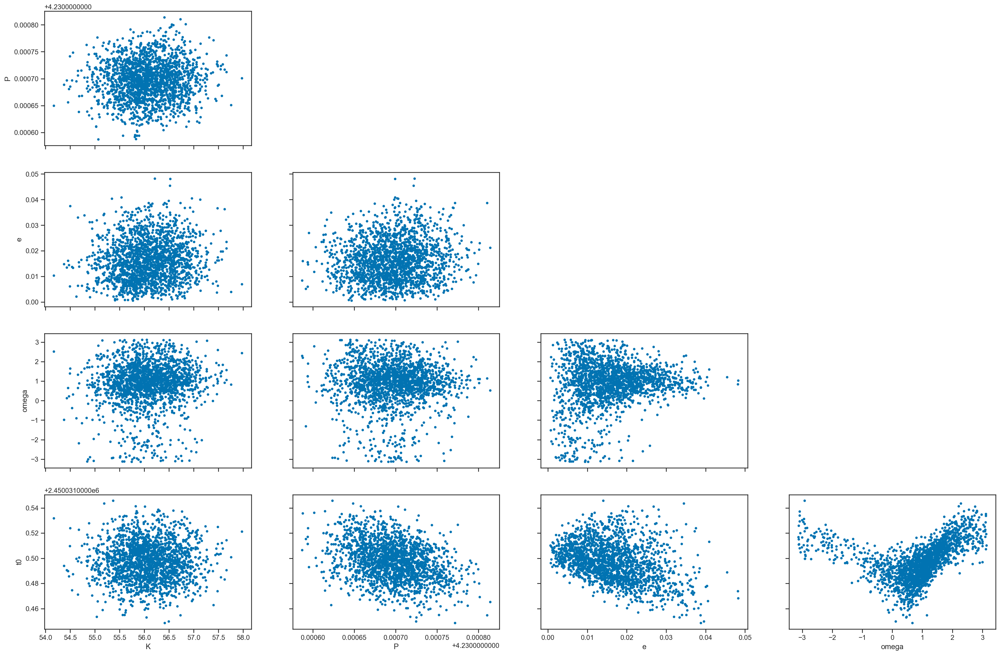

In [34]:
pm.plot_pair(basic_rv_trace, var_names=['K', 'P', 'e', 'omega', 't0'])

/Users/wfarr/miniconda3/envs/Astrostatistics688/lib/python3.9/site-packages/arviz/data/io_pymc3.py:96: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  warnings.warn(


<AxesSubplot:xlabel='A\n0', ylabel='A\n1'>

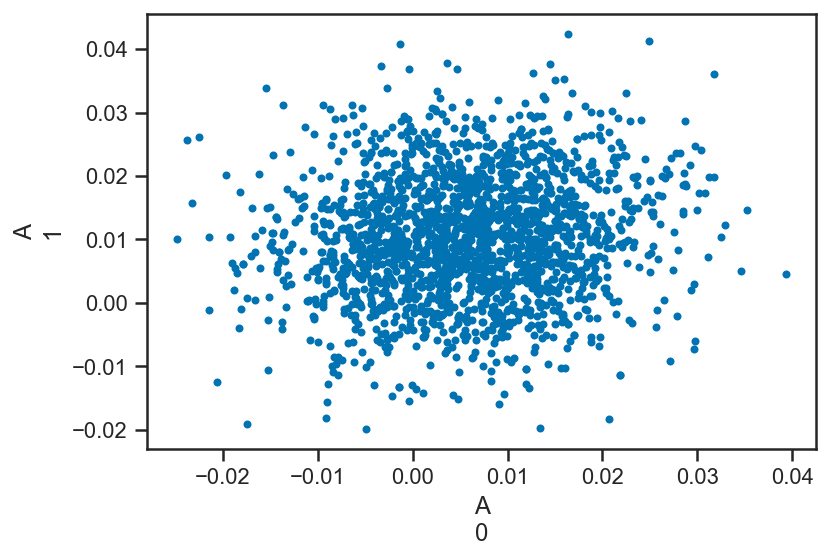

In [35]:
pm.plot_pair(basic_rv_trace, var_names=['A'])

<AxesSubplot:ylabel='Count'>

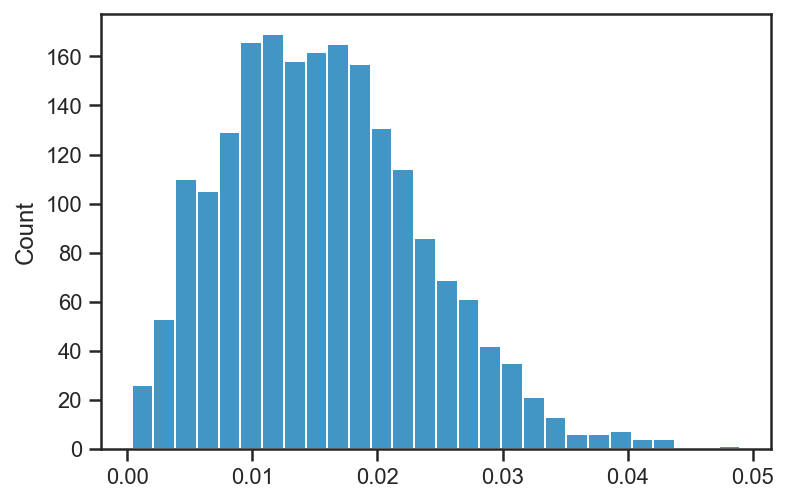

In [17]:
sns.histplot(basic_rv_trace['e'])

/Users/wfarr/miniconda3/envs/Astrostatistics688/lib/python3.9/site-packages/arviz/data/io_pymc3.py:96: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  warnings.warn(


array([[<AxesSubplot:title={'center':'P'}>]], dtype=object)

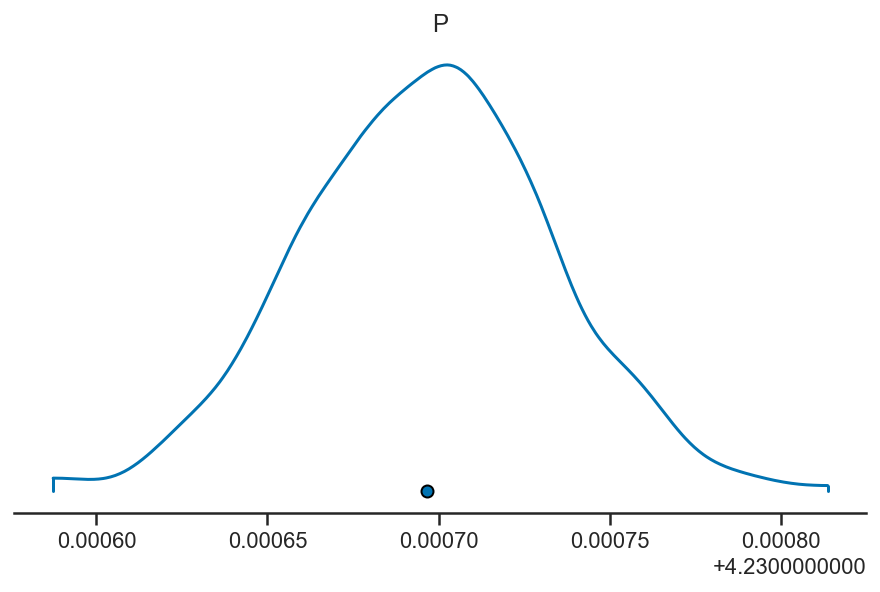

In [36]:
pm.plot_density(basic_rv_trace, var_names=['P'], hdi_prob=1)

/Users/wfarr/miniconda3/envs/Astrostatistics688/lib/python3.9/site-packages/arviz/data/io_pymc3.py:96: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  warnings.warn(


array([[<AxesSubplot:title={'center':'e'}>]], dtype=object)

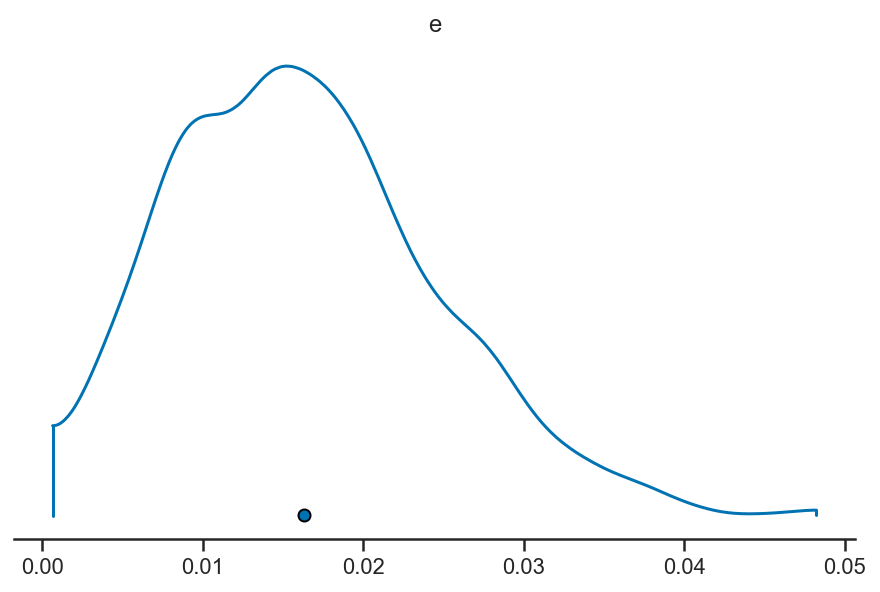

In [37]:
pm.plot_density(basic_rv_trace, var_names=['e'], hdi_prob=1)

In [38]:
m, l, h = quantile(basic_rv_trace['e'], [0.5, 0.16, 0.84])
print('e = {:.4f}^{{+{:.4f}}}_{{-{:.4f}}}'.format(m, h-m, m-l))

e = 0.0156^{+0.0088}_{-0.0075}


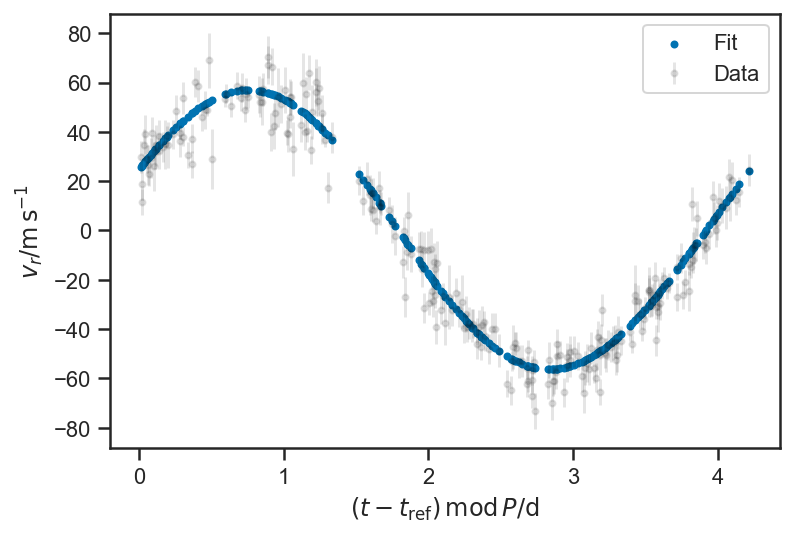

In [39]:
N = basic_rv_trace['P'].shape[0]
i = randint(0, N)
P = basic_rv_trace['P'][i]
plot_data(P = P, color='black', label='Data', alpha=0.1)
plot_rv_curve(basic_rv_trace['v_r'][i,:], P = P, label='Fit')
legend(loc='best')

Text(0, 0.5, '$v_r / \\mathrm{km} \\, \\mathrm{s}^{-1}$')

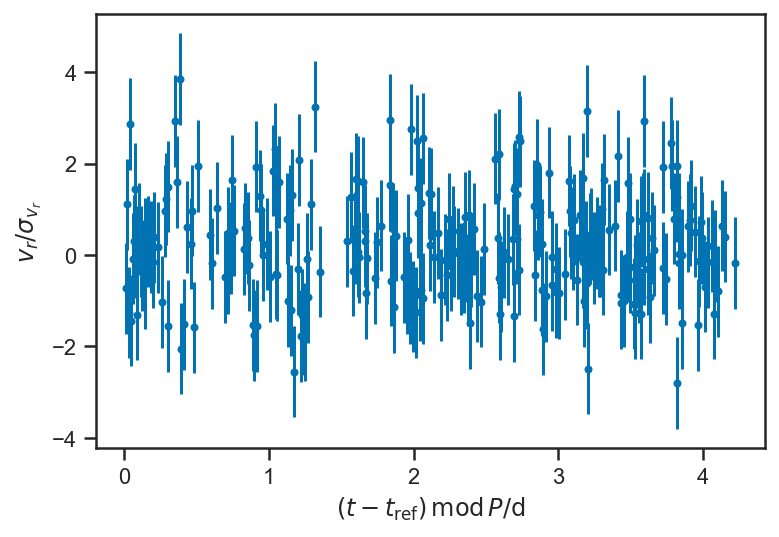

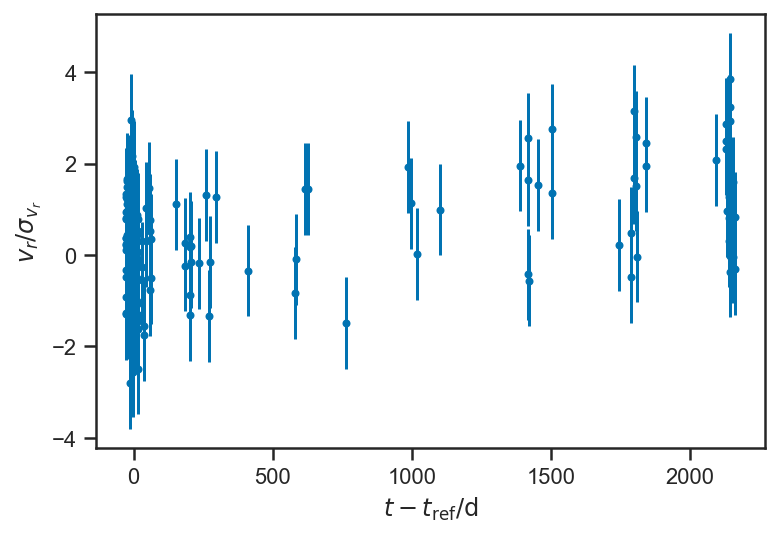

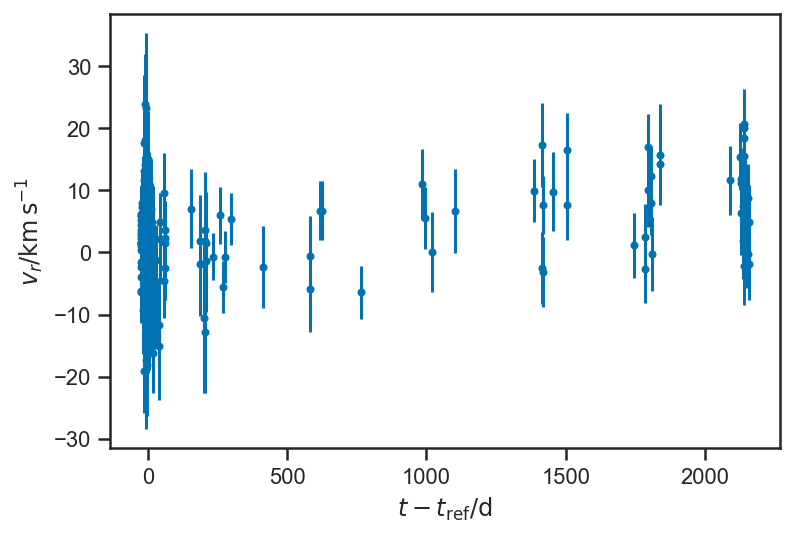

In [40]:
def plot_residuals(rvs, P=None, normalize=True, **kwargs):
    if P is None:
        ts = fopeg_data['JD'] - tmid
        xlabel(r'$t - t_\mathrm{ref} / \mathrm{d}$')
    else:
        ts = (fopeg_data['JD'] - tmid) % P
        xlabel(r'$ \left( t - t_\mathrm{ref} \right) \, \mathrm{mod} \, P / \mathrm{d}$')

    r = rvs - fopeg_data['Radial_Velocity']
    if normalize:
        r = r / fopeg_data['Radial_Velocity_Uncertainty']
        sigma_r = ones_like(r)
    else:
        sigma_r = fopeg_data['Radial_Velocity_Uncertainty']
        
    fmt = kwargs.pop('fmt', '.')
    errorbar(ts, r, yerr=sigma_r, fmt=fmt, **kwargs)
plot_residuals(mean(basic_rv_trace['v_r'], axis=0), P = mean(basic_rv_trace['P']))
ylabel(r'$v_r / \sigma_{v_r}$')
figure()
plot_residuals(mean(basic_rv_trace['v_r'], axis=0))
ylabel(r'$v_r / \sigma_{v_r}$')
figure()
plot_residuals(mean(basic_rv_trace['v_r'], axis=0), normalize=False)
ylabel(r'$v_r / \mathrm{km} \, \mathrm{s}^{-1}$')

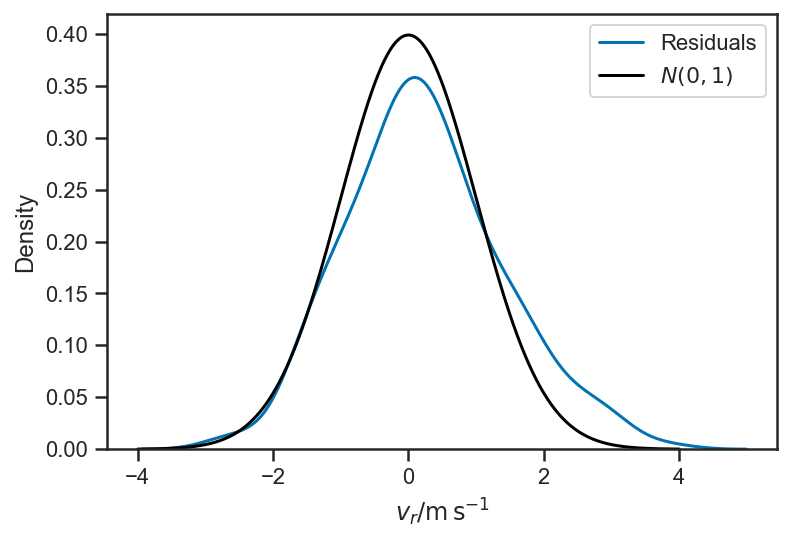

In [41]:
sns.kdeplot((mean(basic_rv_trace['v_r'], axis=0) - fopeg_data['Radial_Velocity'])/fopeg_data['Radial_Velocity_Uncertainty'], label='Residuals')
xlabel(r'$v_r / \mathrm{m} \, \mathrm{s}^{-1}$')
xs = linspace(-4, 4, 1024)
plot(xs, 1/sqrt(2*pi)*exp(-0.5*xs*xs), color='black', label='$N(0,1)$')
legend(loc='best')

In [19]:
with pm.Model() as basic_rv_linear:
    a = pm.Normal('a', mu=0, sigma=1/40)
    b = pm.Normal('b', mu=0, sigma=20)
    
    K = pm.Lognormal("K", mu=log(55.0), sigma=0.1)
    
    dP = pm.Normal("dP", mu=0, sigma=10)
    P = pm.Deterministic("P", P_fop + sigma_P_fop*dP)
    
    # Eccentricity vector:
    A = pmx.UnitDisk("A", testval=[0.01, 0.01])
    e = pm.Deterministic("e", T.sqrt(A[0]*A[0] + A[1]*A[1]))
    omega = pm.Deterministic("omega", T.arctan2(A[1], A[0]))
    
    t0_frac = pm.Uniform("t0_frac", 0, 1, testval=0.5)
    t0 = pm.Deterministic("t0", tmid + P*t0_frac)
    
    orbit = xo.orbits.KeplerianOrbit(period=P, t0=t0, ecc=e, omega=omega)
    
    rv_kepler = pm.Deterministic("v_r_kepler", orbit.get_radial_velocity(fopeg_data['JD'], K=K))
    rv_linear = pm.Deterministic('v_r_linear', a*(fopeg_data['JD'] - tmid) + b)
    rv = pm.Deterministic('v_r', rv_kepler + rv_linear)
    
    _ = pm.Normal("v_r_obs", mu=rv, sigma=fopeg_data['Radial_Velocity_Uncertainty'], observed=fopeg_data['Radial_Velocity'])
    
    basic_rv_linear_trace = pm.sample(draws=1000, tune=1000)

/var/folders/35/vcq24mtj2_g5wk96mbck0cw400018s/T/ipykernel_40610/281116389.py:26: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  basic_rv_linear_trace = pm.sample(draws=1000, tune=1000)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [t0_frac, A, dP, K, b, a]


Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 43 seconds.


/Users/wfarr/miniconda3/envs/Astrostatistics688/lib/python3.9/site-packages/arviz/data/io_pymc3.py:96: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  warnings.warn(


array([[<AxesSubplot:title={'center':'a'}>,
        <AxesSubplot:title={'center':'a'}>],
       [<AxesSubplot:title={'center':'b'}>,
        <AxesSubplot:title={'center':'b'}>],
       [<AxesSubplot:title={'center':'dP'}>,
        <AxesSubplot:title={'center':'dP'}>],
       [<AxesSubplot:title={'center':'K'}>,
        <AxesSubplot:title={'center':'K'}>],
       [<AxesSubplot:title={'center':'P'}>,
        <AxesSubplot:title={'center':'P'}>],
       [<AxesSubplot:title={'center':'A'}>,
        <AxesSubplot:title={'center':'A'}>],
       [<AxesSubplot:title={'center':'e'}>,
        <AxesSubplot:title={'center':'e'}>],
       [<AxesSubplot:title={'center':'omega'}>,
        <AxesSubplot:title={'center':'omega'}>],
       [<AxesSubplot:title={'center':'t0_frac'}>,
        <AxesSubplot:title={'center':'t0_frac'}>],
       [<AxesSubplot:title={'center':'t0'}>,
        <AxesSubplot:title={'center':'t0'}>],
       [<AxesSubplot:title={'center':'v_r_kepler'}>,
        <AxesSubplot:title={'cent

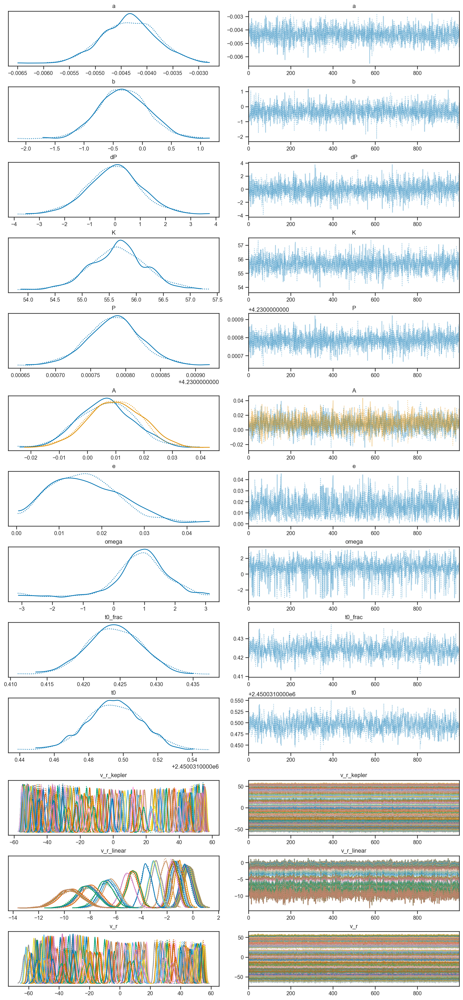

In [20]:
pm.plot_trace(basic_rv_linear_trace)

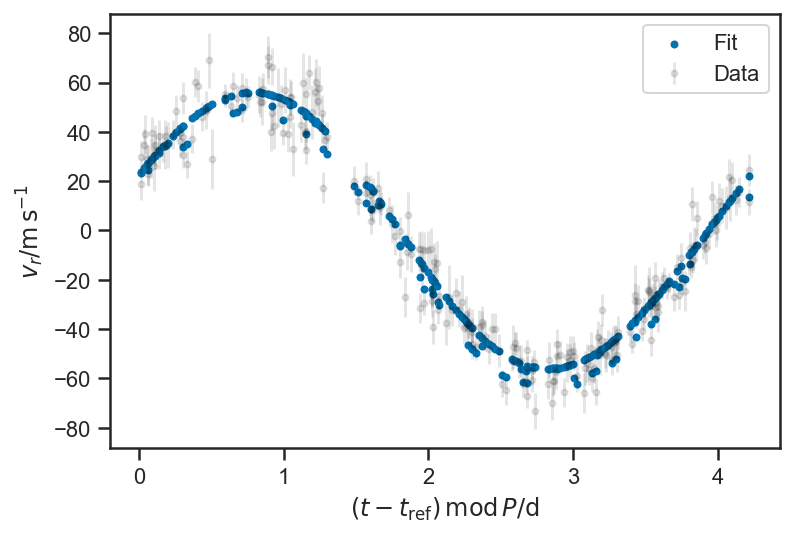

In [24]:
N = basic_rv_linear_trace['P'].shape[0]
i = randint(0, N)
P = basic_rv_linear_trace['P'][i]
plot_data(P = P, color='black', label='Data', alpha=0.1)
plot_rv_curve(basic_rv_linear_trace['v_r'][i,:], P=P, label='Fit')
legend(loc='best')

Text(0, 0.5, '$v_r / \\mathrm{km} \\, \\mathrm{s}^{-1}$')

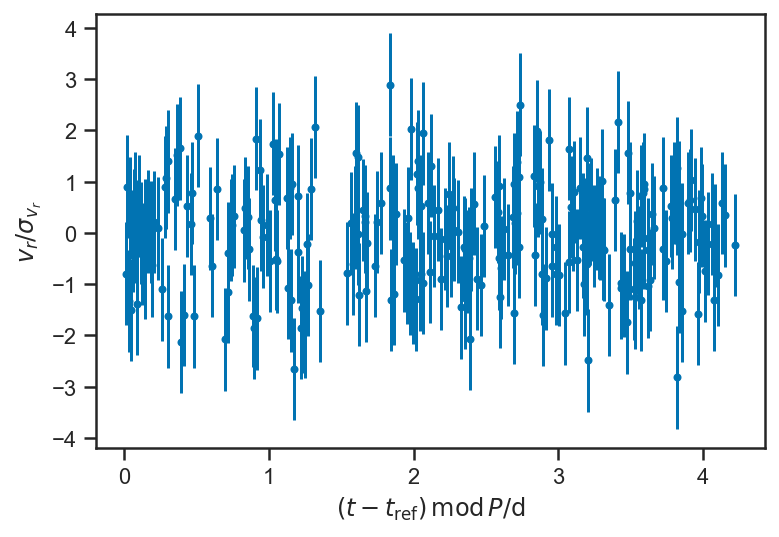

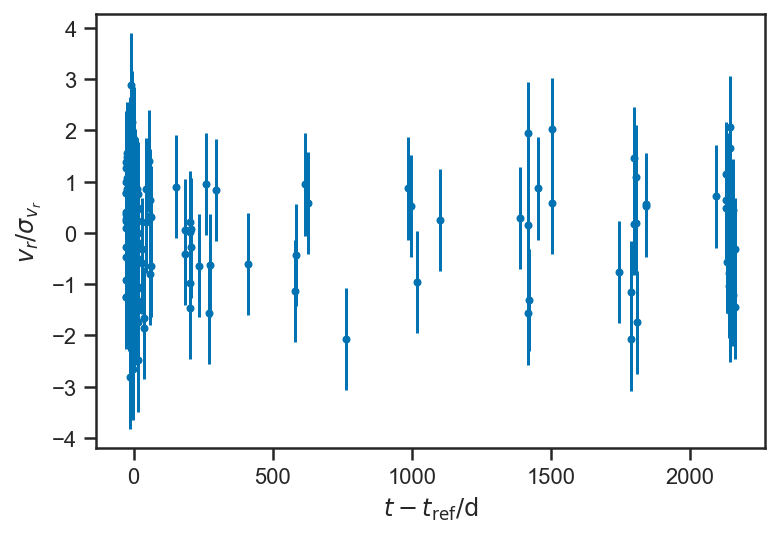

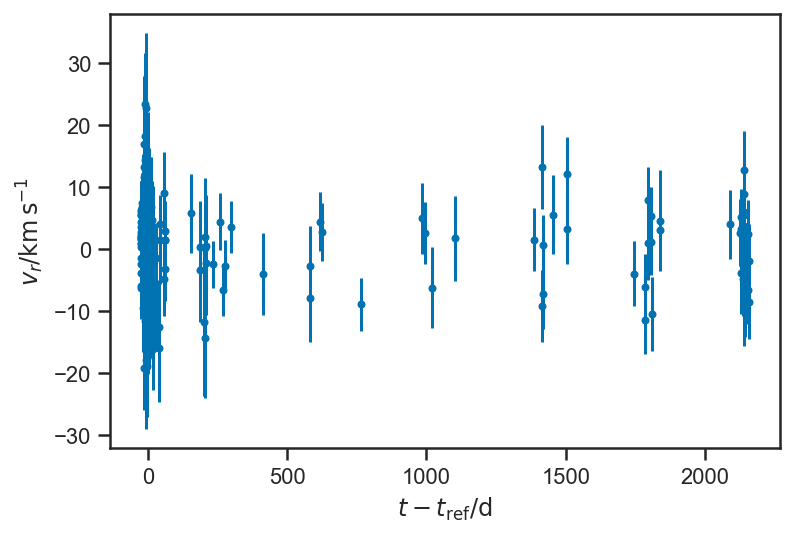

In [26]:
def plot_residuals(rvs, P=None, normalize=True, **kwargs):
    if P is None:
        ts = fopeg_data['JD'] - tmid
        xlabel(r'$t - t_\mathrm{ref} / \mathrm{d}$')
    else:
        ts = (fopeg_data['JD'] - tmid) % P
        xlabel(r'$ \left( t - t_\mathrm{ref} \right) \, \mathrm{mod} \, P / \mathrm{d}$')

    r = rvs - fopeg_data['Radial_Velocity']
    if normalize:
        r = r / fopeg_data['Radial_Velocity_Uncertainty']
        sigma_r = ones_like(r)
    else:
        sigma_r = fopeg_data['Radial_Velocity_Uncertainty']
        
    fmt = kwargs.pop('fmt', '.')
    errorbar(ts, r, yerr=sigma_r, fmt=fmt, **kwargs)
plot_residuals(mean(basic_rv_linear_trace['v_r'], axis=0), P = mean(basic_rv_trace['P']))
ylabel(r'$v_r / \sigma_{v_r}$')
figure()
plot_residuals(mean(basic_rv_linear_trace['v_r'], axis=0))
ylabel(r'$v_r / \sigma_{v_r}$')
figure()
plot_residuals(mean(basic_rv_linear_trace['v_r'], axis=0), normalize=False)
ylabel(r'$v_r / \mathrm{km} \, \mathrm{s}^{-1}$')

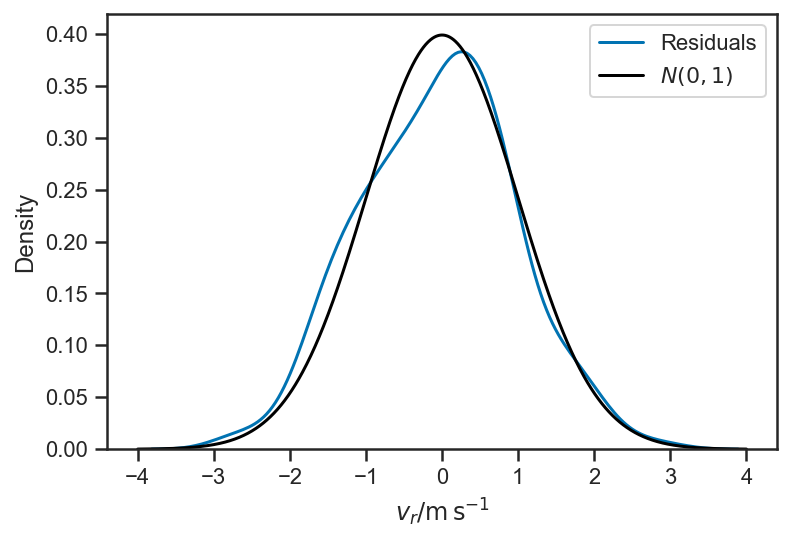

In [27]:
sns.kdeplot((mean(basic_rv_linear_trace['v_r'], axis=0) - fopeg_data['Radial_Velocity'])/fopeg_data['Radial_Velocity_Uncertainty'], label='Residuals')
xlabel(r'$v_r / \mathrm{m} \, \mathrm{s}^{-1}$')
xs = linspace(-4, 4, 1024)
plot(xs, 1/sqrt(2*pi)*exp(-0.5*xs*xs), color='black', label='$N(0,1)$')
legend(loc='best')

## Problems

### Linear Regression

Read {cite}`Hogg2010` (you can find it [here](https://arxiv.org/abs/1008.4686)), and do Exercises 6 and 7 (you may wish to warm up on the earlier exercises, too---they should be pretty trivial given what we have been doing for examples in this class).

### HD126614A

Let's try another planet.  This is HD126614A, from {cite}`Howard2010` (the data come from an "electronic table" [here](https://iopscience.iop.org/0004-637X/721/2/1467/suppdata/apj319972t5_ascii.txt?doi=10.1088/0004-637X/721/2/1467)).  Fit this data to a Keplerian orbit (plus maybe some other terms in the RV?) and compare your fit for the Keplerian parameters to the fit in {cite}`Howard2010`.  Be sure to pay attention to setting up the problem for the model so that the variables that are actually sampled over are unit-scale (see above, e.g., the `dP` parameter, etc).

In [42]:
hd126614A_data = Table.read("data/HowardEtAl2010-HD126614A-apj319972t5_ascii.txt", format='ascii', header_start=3, data_start=4,
                            names=['JD', 'vr', 'sigma_vr', 'instrument'])
hd126614A_data

JD,vr,sigma_vr,instrument
float64,float64,float64,str1
11200.13355,-175.78,1.26,K
11311.92294,-169.56,2.17,K
11342.85107,-155.44,1.47,K
11370.81727,-151.7,1.44,K
11373.83647,-146.7,1.77,K
11552.15999,-135.05,1.28,K
...,...,...,...
15041.84683,4.8,1.33,K
15042.87063,8.59,1.45,K


Text(0, 0.5, '$v_r / \\mathrm{m} \\, \\mathrm{s}^{-1}$')

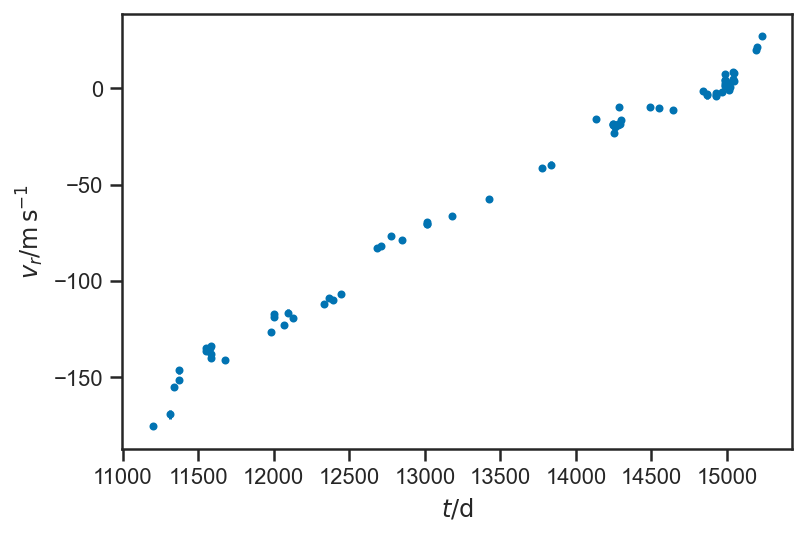

In [43]:
errorbar(hd126614A_data['JD'], hd126614A_data['vr'], yerr=hd126614A_data['sigma_vr'], fmt='.')
xlabel(r'$t / \mathrm{d}$')
ylabel(r'$v_r / \mathrm{m} \, \mathrm{s}^{-1}$')

### A Planet of Your Choosing

Fit your favorite planet's orbital parameters, paying careful attention to describing and assessing the components of the model you are building to represent the data.  Convince me, via appropriate plots / description, that you have accounted for all non-Keplerian effects in the data with your model.